# Recommendations Systems
## Homework 1: Matrix Factorization 
**By Millis Sahar** (approved by Asi)

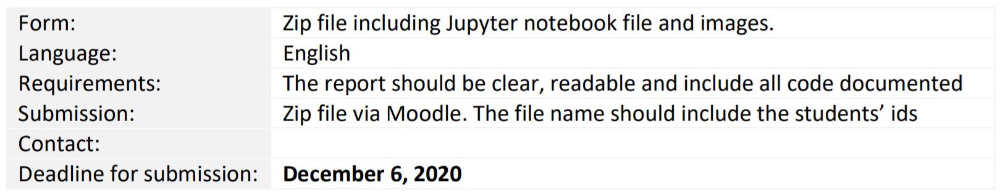

Students will form teams of two people each, and submit a single homework for each team.   
The same score for the homework will be given to each member of the team.    

Submit your solution in the form of an Jupyter notebook file (with extension ipynb).   
Images of graphs or tables should be submitted as PNG or JPG files.  
The code used to answer the questions should be included, runnable and documented in the notebook.   
Python 3.6 should be used.  

The goal of this homework is to let you understand the details of matrix factorization algorithm and practice recommender system training and evaluation.   
You should implement the matrix factorization algorithm by yourself using only basic Python libraries (such as numpy).

Submission:   
Submission of the homework will be done via Moodle by uploading a zip file containing a Jupyter notbook and images.   
The homework needs to be entirely in English.   
The deadline for submission of Homework 1 is set to December 6, 2020 end of day Israel.  


**This is my final results:**
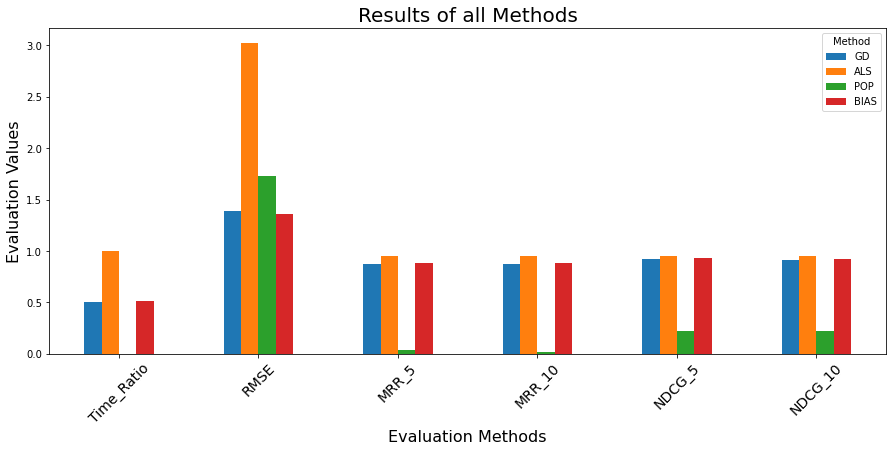

**Imports**

In [1]:
import time

# general
import warnings
import numpy as np
import scipy as sp
import pandas as pd

# visual
import seaborn as sns
import wordcloud as wc
import matplotlib.pyplot as plt
import matplotlib.ticker as tck

# visual 3D
from mpl_toolkits import mplot3d

# logic
from sklearn.metrics import mean_squared_error as MSE
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer
from scipy.spatial.distance import cosine

**Hide Warnings**

In [2]:
warnings.filterwarnings('ignore')

**Disable Autoscrolling**

In [3]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

# Question 1: Data exploration (15 points)

Download the MovieLens 100K rating dataset.   
Calculate the dataset sparsity, distribution of number of ratings as well as the average rating value per user\item.  
Include additional exploration you find relevant to questions 2 and 3.  
Discuss your insights and possible challenges related to the prediction task described in question 2.  

In [4]:
# download and extract to dir

link_movielens100k = 'http://files.grouplens.org/datasets/movielens/ml-100k.zip'
data_dir = 'ml-100k/'

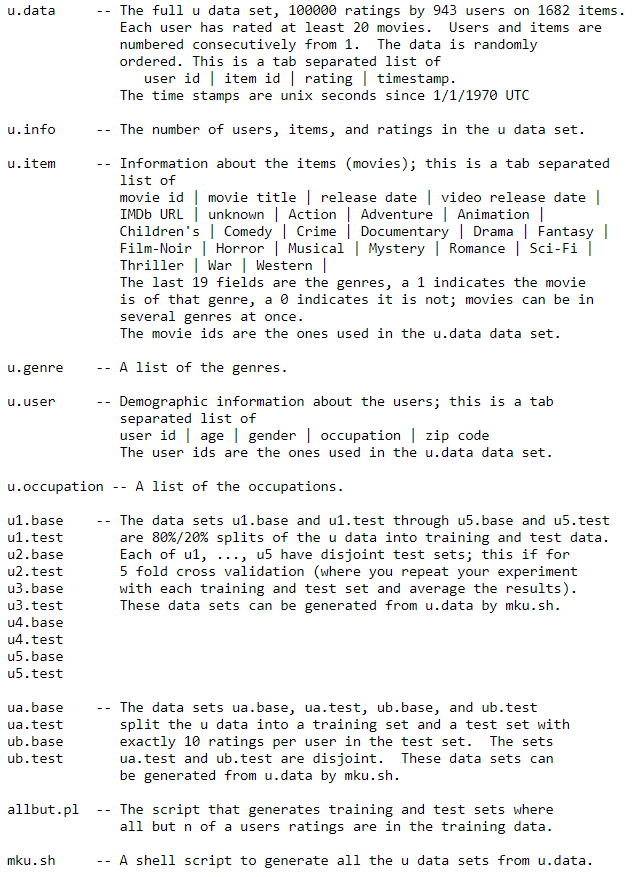

**Columns Names**

In [5]:
cols_data = ['user_id','item_id','rating','timestamp']
cols_user = ['user_id','age','gender','occupation','zip code']
cols_item = ['movie id','movie_title','release_date','video_release_date','IMDb_URL','unknown','Action','Adventure','Animation',
             'Childrens','Comedy','Crime','Documentary','Drama','Fantasy','Film_Noir','Horror','Musical','Mystery','Romance',
             'Sci_Fi','Thriller','War','Western']

**Read users data file**

In [6]:
df_users = pd.read_csv(data_dir + 'u.user',delimiter='|', header=None,names=cols_user)
df_users.shape

(943, 5)

**Read items(movies) data file**

In [7]:
df_items = pd.read_csv(data_dir + 'u.item',delimiter='|', header=None,names=cols_item,encoding="ISO-8859-1")
df_items.shape

(1682, 24)

**Read rating data file**

In [8]:
df_ratings = pd.read_csv(data_dir + 'u.data',delimiter='\t', header=None,names=cols_data)
df_ratings.shape

(100000, 4)

Making sure shapes are mathing the info data file

In [9]:
open(data_dir + 'u.info').readlines()

['943 users\n', '1682 items\n', '100000 ratings\n']

<br><br><br><br>

**Explore ratings data:**

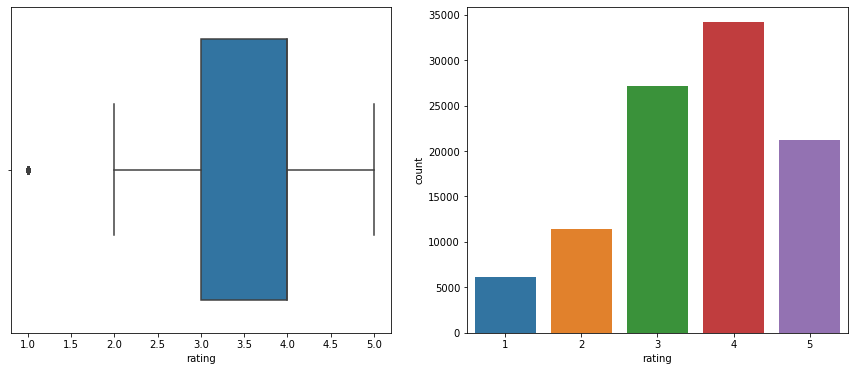

In [10]:
f, axes = plt.subplots(1, 2,figsize=(15,6))
sns.boxplot(df_ratings.rating,ax=axes[0])
sns.countplot(df_ratings.rating,ax=axes[1])
plt.show()

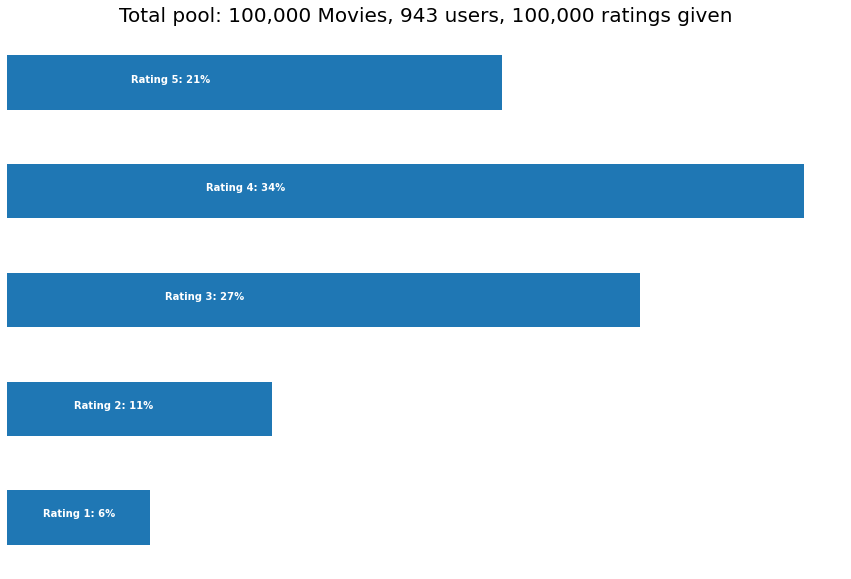

In [11]:
p = df_ratings.groupby('rating')['rating'].agg(['count'])
movie_count = df_ratings.item_id.count()
cust_count = df_ratings.user_id.nunique() 
rating_count = df_ratings.user_id.count()

ax = p.plot(kind = 'barh', legend = False, figsize = (15,10))
plt.title('Total pool: {:,} Movies, {:,} users, {:,} ratings given'.format(movie_count, cust_count, rating_count), fontsize=20)
plt.axis('off')

for i in range(1,6):
    ax.text(p.iloc[i-1][0]/4, i-1, 'Rating {}: {:.0f}%'.format(i, p.iloc[i-1][0]*100 / p.sum()[0]), color = 'white', weight = 'bold')

**Movie ratings aggregated by user**

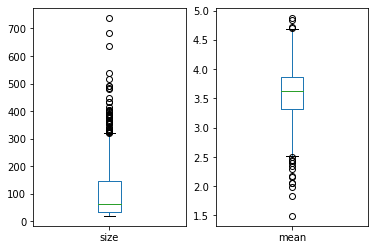

In [12]:
userRatingsAggr = df_ratings.groupby(['user_id']).agg({'rating': [np.size, np.mean]})
userRatingsAggr.reset_index(inplace=True)  # To reset multilevel (pivot-like) index
userRatingsAggr['rating'].plot(kind='box', subplots=True)
plt.show();

I observe that most of the movies recieved around 150 rates with an average of 3.75.

**Movie ratings aggregated by movies**

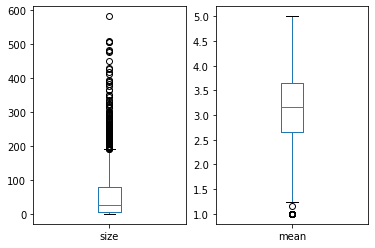

In [13]:
movieRatingsAggr = df_ratings.groupby(['item_id']).agg({'rating': [np.size, np.mean]})
movieRatingsAggr.reset_index(inplace=True)
movieRatingsAggr['rating'].plot(kind='box', subplots=True)
plt.show()

Most of the movies have between 10 to 500 rates with the same average rate of 3.4.
<br><br><br><br>

### Genres

In [14]:
df_items.sample()

,movie id,movie_title,release_date,video_release_date,IMDb_URL,unknown,Action,Adventure,Animation,Childrens,...,Fantasy,Film_Noir,Horror,Musical,Mystery,Romance,Sci_Fi,Thriller,War,Western
348,349,Hard Rain (1998),16-Jan-1998,NaN,http://us.imdb.com/M/title-exact?imdb-title-12...,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0


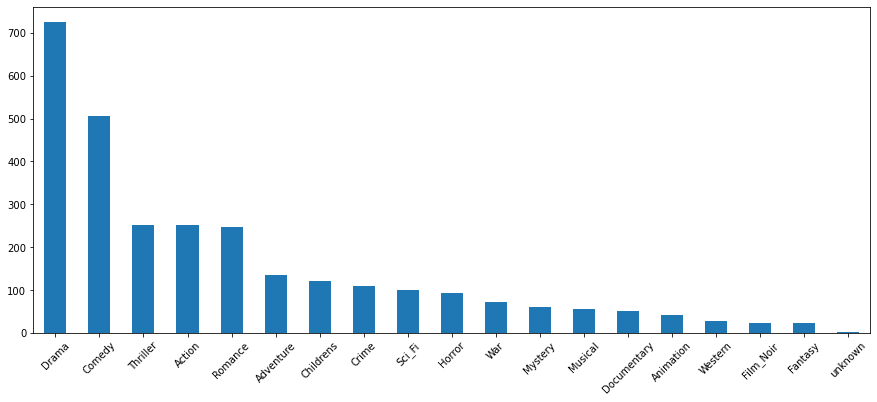

In [15]:
plt.figure(figsize=(15,6))
df_items.iloc[:,5:].sum().sort_values(ascending=False).plot.bar()
plt.xticks(rotation=45)
plt.show();

### Matrix:

In [16]:
ratings = df_ratings.pivot(index = 'user_id', columns ='item_id', values = 'rating').fillna(0)
ratings.head()

item_id,1,2,3,4,5,6,7,8,9,10,...,1673,1674,1675,1676,1677,1678,1679,1680,1681,1682
user_id,,,,,,,,,,,,,,,,,,,,,
1,5.0,3.0,4.0,3.0,3.0,5.0,4.0,1.0,5.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,4.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<br><br>

**Calculate the dataset sparsity:**

$$
Density  = \frac{\text{number of nonzero ratings in the matrix}}{\text{number of users}\times\text{number of items}} 
\quad \qquad
Sparcity = 1 - \frac{\text{number of nonzero ratings in the matrix}}{\text{number of users}\times\text{number of items}}
$$

In [17]:
print('Sparcity is equal to ' + str(round((1-np.count_nonzero(ratings)/ratings.size)*100,2))+'%')

Sparcity is equal to 93.7%


**Distribution of number of ratings per user\item**

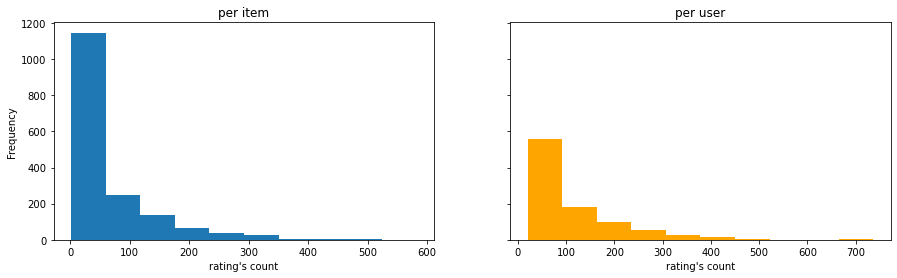

In [18]:
fig, ax = plt.subplots(1, 2, sharex='col', sharey='row', figsize=(15, 4))

ratings.astype(bool).sum(axis=0).plot.hist(ax=ax[0])
ratings.astype(bool).sum(axis=1).plot.hist(ax=ax[1],color='orange')
ax[0].set_title('per item')
ax[1].set_title('per user')
ax[0].set_xlabel('rating\'s count')
ax[1].set_xlabel('rating\'s count');

**Distribution of average rating value  per user\item**

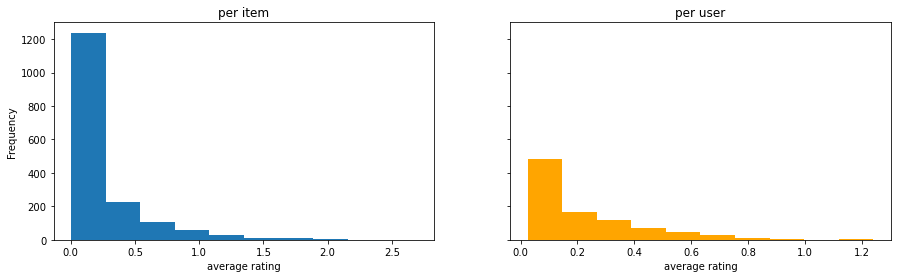

In [19]:
fig, ax = plt.subplots(1, 2, sharex='col', sharey='row', figsize=(15, 4))

ratings.mean(axis=0).plot.hist(ax=ax[0])
ratings.mean(axis=1).plot.hist(ax=ax[1],color='orange')
ax[0].set_title('per item')
ax[1].set_title('per user')
ax[0].set_xlabel('average rating')
ax[1].set_xlabel('average rating');

Drama and comedy are the most present comparing to other catagories.

<br><br><br>

**Conclutions:**
  
As expected the dataset is **SPARSE!**.  
Which means it will be challanging to use a simple model to predict user's rating - but this is the whole point :))  

There is a bias on the ratings.    
I guess there is an option using generes to help with recommendations.   

<br><br><br><br><br><br>

# Question 2: Matrix factorization model implementation and evaluation (60 points)

**Split the data to 5 folds**

In [20]:
dfs = {i:
       {'train' : pd.read_csv('{}u{}.base'.format(data_dir,i), delimiter='\t', header=None, names=cols_data),
        'test'  : pd.read_csv('{}u{}.test'.format(data_dir,i), delimiter='\t', header=None, names=cols_data)
       } for i in range(1,6)} 

def df2matrix(i):
    train = dfs[i]['train'].pivot(index = 'user_id', columns ='item_id', values = 'rating').fillna(0)
    test  = dfs[i]['test'].pivot(index = 'user_id', columns ='item_id', values = 'rating').fillna(0)
    return train,test 

train,test = df2matrix(1)

In [21]:
train

item_id,1,2,3,4,5,6,7,8,9,10,...,1673,1674,1675,1676,1677,1678,1679,1680,1681,1682
user_id,,,,,,,,,,,,,,,,,,,,,
1,5.0,3.0,4.0,3.0,3.0,0.0,4.0,1.0,5.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
939,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
940,0.0,0.0,0.0,2.0,0.0,0.0,4.0,5.0,3.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
941,5.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [22]:
test

item_id,1,2,3,4,5,6,7,8,9,10,...,1555,1557,1561,1562,1563,1565,1578,1582,1586,1591
user_id,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,4.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
457,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
458,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
459,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<br><br>
### Popularity model

Although mentioned, I don't think there is a point on running Kfold on poplar model, cuz there are not evaluation stage, and no learning/training. but let's do it...


In [23]:
def pop_RMSE(train,test,bias_global):
    means = test.mean()
    means[ np.setdiff1d(test.columns,train.columns) ] = bias_global
    means[ np.intersect1d(test.columns,train.columns) ] = train.mean() [np.intersect1d(test.columns,train.columns)]

    return np.sqrt((test[test!=0] - means).stack().mean())



def MRR(relevant_preds, relevant_test, num_of_recommendations):
    # MRR
    rrs = []
    for i in range(relevant_preds.shape[0]):
        test_values = relevant_test[i, :]
        pred_values = relevant_preds[i, :]
        non_zero_test_inds = test_values > 0
        non_zero_test = test_values[non_zero_test_inds]
        non_zero_pred = pred_values[non_zero_test_inds]
        sort_pred_inds = np.argsort(non_zero_pred)
        final_test = non_zero_test[sort_pred_inds][-num_of_recommendations:]
        final_pred = non_zero_pred[sort_pred_inds][-num_of_recommendations:]
        final_arr = ((final_test > 3) & (final_pred > 3)).astype(int)
        if final_arr.sum() == 0:
            rr = 0
            rrs.append(rr)
        else:
            rr = 1 / (np.argmax(final_arr) + 1)
            rrs.append(rr)
    mrr = np.mean(rrs)
    return mrr

def get_mean_ndcg(relevant_preds, relevant_test, num_of_recommendations):
    ndcgs = []
    for i in range(relevant_preds.shape[0]):
        test_values = relevant_test[i, :]
        pred_values = relevant_preds[i, :]
        non_zero_test_inds = test_values > 0
        non_zero_test = test_values[non_zero_test_inds]
        non_zero_pred = pred_values[non_zero_test_inds]
        if non_zero_pred.sum() == 0:
            ndcg = 0
            ndcgs.append(ndcg)
            continue
        sort_pred_inds = np.argsort(non_zero_pred)
        top_test_pred_based = non_zero_test[sort_pred_inds][-num_of_recommendations:]
        denominator = np.append(2, np.arange(len(top_test_pred_based)-1) + 2)
        dcg = (top_test_pred_based / (np.log2(denominator))).sum()
        top_test_sorted = np.sort(top_test_pred_based)[::-1]
        idcg = (top_test_sorted / (np.log2(denominator))).sum()
        ndcg = dcg / idcg
        ndcgs.append(ndcg)
    mean_ndcg = np.mean(ndcgs)
    return mean_ndcg

def get_rmse(predictions, targets):
    rmse = np.sqrt(np.mean((predictions-targets)**2))
    return  rmse


def popularity_base_recommender(df, N, min_movie_ratings):
    popular_df = df.groupby('movieId').agg({'rating': [np.size, np.mean]}).sort_values([('rating', 'mean')], ascending=False)["rating"]
    popular_df_with_min_ratings = popular_df.loc[popular_df["size"] >= min_movie_ratings]
    recommended_movie_ids = np.array(popular_df_with_min_ratings.index[:N])
    return recommended_movie_ids



<br><br><br><br>
<br><br><br><br>
<br><br><br><br>

### Implement explicit matrix factorization algorithm to predict the rating a user will provide to an item and recommendation of top N items.   

Use the RMSE, MRR and NDCG metrics to evaluate your recommender system.   
For the MRR and NDCG metrics use cutoff values of 5 and 10.   

In [24]:
class MF():
    def __init__(self,matrix,n_factors=10,only_bias=False):
        self.matrix = matrix
        self.n_factors = n_factors
        self.only_bias = only_bias
        
        # rows==users , cols==items
        self.n_rows, self.n_cols = matrix.shape
        
        # biases
        self.original_bias_global = np.sum(matrix)/np.count_nonzero(matrix)
        self.original_bias_rows   = np.sum(matrix,axis=1)/np.count_nonzero(matrix,axis=1) 
        self.original_bias_cols   = np.sum(matrix,axis=0)/np.count_nonzero(matrix,axis=0)
        
        # initilizing 
        self.initilize_params()
        
    
    def initilize_params(self):
        
        
        # initilize
        if self.only_bias:
            self.rows = np.zeros((self.n_rows,self.n_factors))            
            self.cols = np.zeros((self.n_cols,self.n_factors))
        else:
            self.rows = np.random.rand(self.n_rows,self.n_factors)            
            self.cols = np.random.rand(self.n_cols,self.n_factors)
        
        # initilize bias
        self.bias_global = self.original_bias_global # not learning it
        self.bias_rows   = np.random.rand(self.n_rows)
        self.bias_cols   = np.random.rand(self.n_cols)
      
    
    def get_RMSE(self):
        # flatten matrix
        pred = self.predict_all().flatten()
        m = self.matrix.flatten()
        
        # get relevant ratings 
        idxs = m.nonzero()
        
        # range of values
        pred[pred>5] = 5
        pred[pred<1] = 1
        
        # compute RMSE
        e = m[idxs] - pred[idxs]
        e = np.square(e)
        e = np.mean(e)
        e = np.sqrt(e)
        return e
    
    
    def get_error(self,i_row,i_col):
        if self.matrix[i_row,i_col] == 0:
            return 0
        pred = self.predict(i_row,i_col)
        e = self.matrix[i_row,i_col] - pred
        return e
    
    
    def predict_all(self):
        i_row = np.arange(self.n_rows)
        i_col = np.arange(self.n_cols)
        return self.predict(i_row,i_col)
    
    
    def predict(self,i_row,i_col):
        pred = np.dot(self.rows[i_row],self.cols[i_col].T)
        pred += self.bias_global
        pred += self.bias_rows[i_row,np.newaxis]
        pred += self.bias_cols[np.newaxis,i_col]
        return pred
    
    
    def converging(self):
        return np.abs(self.history[-1]-self.history[-2])<self.ϵ            
    
        
    def train_folds():
        pass  
    
    def train(self,optim='GD',n_iterations=1,learning_rate=1e-1,regularization=1e-2,convergence=1e-5,error='RMSE',initilize_training=True,verbose=True):
        
        self.n_iterations = n_iterations
        self.α = learning_rate
        self.λ = regularization
        self.ϵ = convergence
                
        if initilize_training:
            self.initilize_params()

        self.history = []        
            
        for current_iteration in range(self.n_iterations):
            
            self.history.append(self.get_RMSE())
            
            # printing
            if verbose:
                print('iteration:',current_iteration,' total error:\n',self.history[-1])
            
            # convergence
            if current_iteration!=0 and self.converging():
                
                if verbose:
                    print('converge...')
                break
            
            if optim == 'GD':
                self.rows_indices = np.arange(self.n_rows)
                self.cols_indices = np.arange(self.n_cols)
                self.optim_GD()
            else: #  optim == 'ALS'
                self.optim_ALS()
                

    def optim_GD(self):
        for i_row,i_col in zip(self.rows_indices,self.cols_indices):
            e = self.get_error(i_row,i_col)
            
            
            if not self.only_bias:
                # update latent
                self.rows[i_row] += self.α * (e*self.cols[i_col] - self.λ * self.rows[i_row]) 
                self.cols[i_col] += self.α * (e*self.rows[i_row] - self.λ * self.cols[i_col])

            # update bias
            self.bias_rows[i_row] += self.α * (e - self.λ * self.bias_rows[i_row])
            self.bias_cols[i_col] += self.α * (e - self.λ * self.bias_cols[i_col])
        
        
    def optim_ALS(self):
        self.step_rows()
        self.step_cols()
        
        
    def step_rows(self):
        YtY = np.dot(self.cols.T,self.cols)
        λI  = self.λ * np.eye(self.n_factors)
        Xs = (YtY + λI)
        for i in range(self.n_rows):
            Ys = np.dot(self.matrix[i].T,self.cols)
            self.rows[i] = np.linalg.solve( Xs,Ys )
        
    
    def step_cols(self):
        YtY = np.dot(self.rows.T,self.rows)
        λI  = self.λ * np.eye(self.n_factors)
        Xs = (YtY + λI)
        for i in range(self.n_cols):
            Ys = np.dot(self.matrix[:,i].T,self.rows)
            self.cols[i] = np.linalg.solve( Xs,Ys )
                
    
train,test = df2matrix(3)            
mf = MF(train.values,n_factors=5,only_bias=False)
mf.train(n_iterations=20,verbose=False,optim='GD',regularization=0.01,convergence=1e-100,learning_rate=0.1)

'done'

'done'

In [139]:
class eval_metrics():
    def __init__(self,train_df,pred_np,test_df,top_n=5):
        self.top_n = top_n
        
        # from np to df
        pred_df = pd.DataFrame(data=pred_np, index=train_df.index, columns=train_df.columns)
        
        # rows and cols in both
        rs = np.intersect1d(np.array(train_df.index),np.array(test_df.index))
        cs = np.intersect1d(np.array(train_df.columns),np.array(test_df.columns))
        
        # get relevent rows and clos
        actual = test_df.loc[rs,cs]
        predic = pred_df.loc[rs,cs]
        
        # get non-zeros values
        self.actual = actual[actual!=0]
        self.predic = predic[actual!=0]
        
        
    def RMSE(self):
        # clip values
        predic = self.predic.copy()
        predic[predic>=5] = 5
        predic[predic<=0] = 0
        return ((self.actual - predic)**2).stack().mean()
    
    def MRR(self,top_n=5):
        self.top_n = top_n
        score = 0
        for p,t in zip(self.predic.iterrows(),self.actual.iterrows()):
            score += self.MRR_user(p[1],t[1])
        return score/self.predic.shape[0]
    
    def MRR_user(self,pred,test):
        i = pred.nlargest(self.top_n).index
        b = ((test[i] >=3) & (pred[i] >=3)).reset_index(drop=True)
        if len(b[b==1])==0:
            return 0
        RR = ((b.nlargest(1).index+1).values[0])
        return 1/RR
        
    def NDCG(self,top_n=5):
        self.top_n = top_n
        # clip values
        predic = self.predic.copy()
        
        score = 0
        for p,t in zip(predic.iterrows(),self.actual.iterrows()):
            score += self.NDCG_user(p[1],t[1])
        return score/self.predic.shape[0]
    
    def NDCG_user(self,pred,test):
        i = pred.nlargest(self.top_n).index
        
        # in case not enough ratings
        if len(i) == 0:
            return 0
        elif len(i)!=self.top_n:
            top_n = np.min([self.top_n,len(i)])
        else:
            top_n = self.top_n
        
        j = test[i].nlargest(self.top_n).index
        
        dcg  = self.DCG(test[i].values,top_n)
        idcg = self.DCG(test[j].values,top_n)
        
        if idcg==0:
            return 0
        return dcg/idcg
    
    
    def DCG(self,sorted_arr,top_n):
        sorted_arr[np.isnan(sorted_arr)] = 0        
        i = np.arange(top_n)+1
        rel_i = sorted_arr/np.log2(i+1)
        return np.sum(rel_i)
    
    def get_error(self):        
        return {'RMSE':self.RMSE(),'MRR_5':self.MRR(top_n=5),'MRR_10':self.MRR(top_n=10),'NDCG_5':self.NDCG(top_n=5),'NDCG_10':self.NDCG(top_n=10)}

                             
em = eval_metrics(train,mf.predict_all(),test)
em.MRR()

0.886037591100883

In [140]:
train

item_id,1,2,3,4,5,6,7,8,9,10,...,1673,1674,1675,1676,1677,1678,1679,1680,1681,1682
user_id,,,,,,,,,,,,,,,,,,,,,
1,5.0,3.0,4.0,3.0,0.0,5.0,4.0,1.0,5.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,4.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
939,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
940,0.0,0.0,0.0,2.0,0.0,0.0,4.0,5.0,3.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
941,5.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<br><br><br>

## Produce a learning curve graph and a table which compares the results of the following algorithms:  

<br><br><br>


In [26]:
final_results = pd.DataFrame(columns=['Method','Time_Ratio','RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10'])

### Different choices of the latent factor dimension, regularization, learning rate.
and Find best hyperparameters using K-folds


While running of these permutations:

    - n_iterations   = [20]     
    - convergence    = [1e-5]    
    - latent_factors = [5,10,20]    
    - regularization = [0.01,0.1,1]    
    - learning_rate  = [0.001,0.01,0.1]    

and averaging the K-folds results the metrics...

In [27]:
n_iterations   = [20] # due to computational power
convergence    = [1e-5]  # used only 1 due to moodle note form Asi
latent_factors = [5,10,20]
regularization = [0.01,0.1,1]
learning_rate  = [0.001,0.01,0.1]
kfolds = np.arange(len(dfs))+1


# def run_train(n_iterations,convergence,latent_factors,regularization,learning_rate,kfolds)
results = pd.DataFrame(columns=['Latent_factors','Iterations','Learning_Rate','Regularization','Convergence','RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10','History'])

start = time.time()
for lf in latent_factors:
    for n_iter in n_iterations:
        for lr in learning_rate:
            for reg in regularization:
                for conv in convergence:
                    dic = {'Latent_factors':lf,'Iterations':n_iter,'Learning_Rate':lr,'Regularization':reg,'Convergence':conv}

                    means = pd.DataFrame(columns=['RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10'])
                    for k in kfolds:
                        # get the Kth fold
                        train,test = df2matrix(k)

                        # initial MF
                        mf = MF(train.values,n_factors=lf)

                        # train MF
                        mf.train(n_iterations=n_iter,verbose=False,optim='GD',learning_rate=lr,regularization=reg,convergence=conv)

                        # eval MF
                        em = eval_metrics(train,mf.predict_all(),test)
                        e  = em.get_error()
                        means = means.append(e,ignore_index=True)

                    # after Kfolds loop
                    dic.update(means.mean().to_dict())
                    dic.update({'History':mf.history})
                    results = results.append(dic,ignore_index=True)

end = time.time()-start                    
results

,Latent_factors,Iterations,Learning_Rate,Regularization,Convergence,RMSE,MRR_5,MRR_10,NDCG_5,NDCG_10,History
0,5,20,0.001,0.01,0.00001,3.337934,0.911155,0.911285,0.934109,0.923665,"[1.8333929648419003, 1.8333345410207955, 1.833..."
1,5,20,0.001,0.10,0.00001,3.344086,0.908784,0.909053,0.934722,0.924524,"[1.834481897946314, 1.8344133788029227, 1.8343..."
2,5,20,0.001,1.00,0.00001,3.326212,0.897348,0.897855,0.931004,0.922219,"[1.8342095097437912, 1.8340260851366987, 1.833..."
3,5,20,0.010,0.01,0.00001,3.276138,0.902996,0.903201,0.932063,0.922723,"[1.833512018904118, 1.8325021518301847, 1.8313..."
4,5,20,0.010,0.10,0.00001,3.234812,0.905825,0.906160,0.933272,0.922651,"[1.8329005281143902, 1.8316899016574113, 1.830..."
5,5,20,0.010,1.00,0.00001,3.046669,0.892156,0.892705,0.930507,0.920437,"[1.8324615828368163, 1.8301468968900658, 1.827..."
6,5,20,0.100,0.01,0.00001,3.150959,0.903163,0.903339,0.931598,0.922222,"[1.833128399478401, 1.8116790454552154, 1.7913..."
7,5,20,0.100,0.10,0.00001,2.960945,0.893653,0.894373,0.930253,0.919811,"[1.8306108368790128, 1.8068922409891819, 1.784..."
8,5,20,0.100,1.00,0.00001,1.391769,0.879644,0.880312,0.927500,0.916852,"[1.8320223380901743, 1.7806254096688596, 1.716..."
9,10,20,0.001,0.01,0.00001,3.418370,0.907446,0.907874,0.933425,0.923725,"[1.8511961253968958, 1.8511945489907609]"


**Training history:**

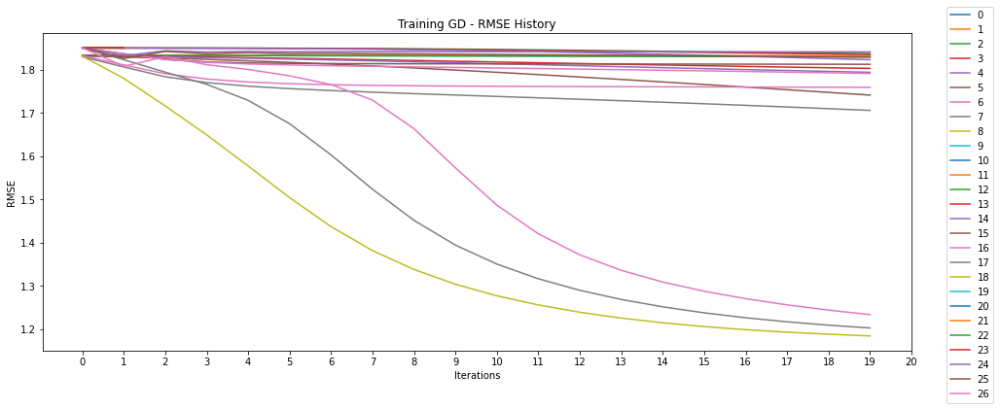

In [28]:
lines = results.History

plt.figure(figsize=(16,6))

for l in lines:
    plt.plot(l)


plt.xticks(np.arange(n_iterations[0]+1))
plt.legend(lines.index,loc='upper right',bbox_to_anchor=(1.1, 1.1))
plt.title('Training GD - RMSE History')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.show();

**Focus on the top 3:**

In [29]:
results.loc[results.RMSE.nsmallest(3).index,:]

,Latent_factors,Iterations,Learning_Rate,Regularization,Convergence,RMSE,MRR_5,MRR_10,NDCG_5,NDCG_10,History
8,5,20,0.1,1.0,0.00001,1.391769,0.879644,0.880312,0.927500,0.916852,"[1.8320223380901743, 1.7806254096688596, 1.716..."
17,10,20,0.1,1.0,0.00001,1.426653,0.878437,0.879122,0.927488,0.917174,"[1.8512267938297695, 1.823715067486675, 1.7949..."
26,20,20,0.1,1.0,0.00001,1.499030,0.875762,0.876520,0.925828,0.915580,"[1.8513339785138714, 1.80854198391508, 1.83095..."


<br>

There is no clear winner.  
Although RMSE is lowest it's still depends on which metrics the models are evaluates.  

<br>

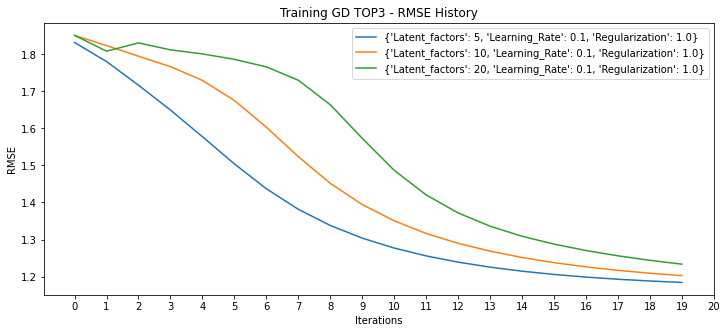

In [30]:
lines = lines[results.RMSE.nsmallest(3).index]
plt.figure(figsize=(12,5))

for l in lines:
    plt.plot(l)

plt.xticks(np.arange(n_iterations[0]+1))

leg = (results.loc[results.RMSE.nsmallest(3).index,['Latent_factors','Learning_Rate','Regularization']]).T.to_dict().values()
plt.xticks(np.arange(n_iterations[0]+1))
plt.title('Training GD TOP3 - RMSE History')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.legend(leg)
plt.show();

In [31]:
gd_final = results.iloc[results.RMSE.nsmallest(1).index][['RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10']].to_dict('records')[0]
gd_final['Method'] = 'GD'
gd_final['Time_Ratio'] = end/len(results)


final_results = final_results.append(gd_final,ignore_index=True)

**Understanding The Effect - Latent Factors - Conclutions:**

There is always a good middleground but the art is to find just the right parameters...
From my experiments it's easy to conclude these:

- Time Tradeoff   
    *The smaller the factors are - less computetions, less time  
    The Bigger - more computetions, more time*   
  
  
- Generalizing  
    *The smaller the factors are we risk underfitting  
    Too large we risk overfitting*

**Understanding The Effect - Learning Rate - Conclutions:**

There is always a good middleground but the art is to find just the right parameters... From my experiments it's easy to conclude these:

- Adaptive  
    *The adaptive approach highly eases the challenging task of the appropriate learning rate configuration, which makes them more commonly used. Furthermore, it often converges much faster and outperforms a model having its learning rate improperly tuned by non-adaptive methods.*
    
    
- Large learning rate  
    *Allows the model to learn faster, at the cost of arriving on a sub-optimal final set of weights.*


- Smaller learning rate   
    *May allow the model to learn a more optimal or even globally optimal set of weights but may take significantly longer to train.*


**Understanding The Effect - Regularization - Conclutions:**

There is always a good middleground but the art is to find just the right parameters... From my experiments it's easy to conclude these:

- Small/Large Weights  
    *Large weights make the network unstable.
    Large weights in a neural network are a sign of a more complex network that has overfit the training data.   
    An L1 or L2 vector norm penalty can be added to the optimization of the network to encourage smaller weights.*
 
    
- Amount of Wieghts  
    *Penalizing a network based on the size of the network weights during training can reduce overfitting.*


<br><br><br><br>

### ALS

Running ALS to check for best params...

In [32]:
n_iterations   = [20] # due to computational power
convergence    = [1e-5]  # used only 1 due to moodle note form Asi
latent_factors = [5,10,20]
regularization = [0.01,0.1,1]
learning_rate  = [0.1]
kfolds = np.arange(len(dfs))+1

results = pd.DataFrame(columns=['Latent_factors','Iterations','Learning_Rate','Regularization','Convergence','RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10','History'])

start = time.time()
for lf in latent_factors:
    for n_iter in n_iterations:
        for lr in learning_rate:
            for reg in regularization:
                for conv in convergence:
                    dic = {'Latent_factors':lf,'Iterations':n_iter,'Learning_Rate':lr,'Regularization':reg,'Convergence':conv}

                    means = pd.DataFrame(columns=['RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10'])
                    for k in kfolds:
                        # get the Kth fold
                        train,test = df2matrix(k)

                        # initial MF
                        mf = MF(train.values,n_factors=lf)

                        # train MF
                        mf.train(n_iterations=n_iter,verbose=False,optim='ALS',learning_rate=lr,regularization=reg,convergence=conv)

                        # eval MF
                        em = eval_metrics(train,mf.predict_all(),test)
                        e  = em.get_error()
                        means = means.append(e,ignore_index=True)

                    # after Kfolds loop
                    dic.update(means.mean().to_dict())
                    dic.update({'History':mf.history})
                    results = results.append(dic,ignore_index=True)

end = time.time()-start
results

,Latent_factors,Iterations,Learning_Rate,Regularization,Convergence,RMSE,MRR_5,MRR_10,NDCG_5,NDCG_10,History
0,5,20,0.1,0.01,0.00001,3.025859,0.956650,0.956797,0.954245,0.946813,"[1.8323045574015393, 1.7411252551410934, 1.764..."
1,5,20,0.1,0.10,0.00001,3.023724,0.953969,0.954070,0.954153,0.947203,"[1.8297902078860466, 1.7368334430047578, 1.759..."
2,5,20,0.1,1.00,0.00001,3.018206,0.953964,0.953964,0.954372,0.947396,"[1.832124054034203, 1.7318524702578608, 1.7496..."
3,10,20,0.1,0.01,0.00001,3.055660,0.961139,0.961222,0.957857,0.951244,"[1.8510455508881565, 1.746620100709702, 1.7714..."
4,10,20,0.1,0.10,0.00001,3.038578,0.958929,0.958977,0.957408,0.950444,"[1.8509725125192105, 1.7400651520462673, 1.766..."
5,10,20,0.1,1.00,0.00001,3.046953,0.959872,0.960024,0.957212,0.950461,"[1.8507989554907585, 1.7313200080851532, 1.760..."
6,20,20,0.1,0.01,0.00001,3.032611,0.961319,0.961381,0.958505,0.951717,"[1.8513339785138714, 1.753760132349117, 1.7747..."
7,20,20,0.1,0.10,0.00001,3.039374,0.962455,0.962618,0.957816,0.950411,"[1.8513339785138714, 1.7582464651579415, 1.777..."
8,20,20,0.1,1.00,0.00001,3.037476,0.964005,0.964078,0.958431,0.951736,"[1.8513339785138714, 1.752600124133361, 1.7793..."


**Training history:**

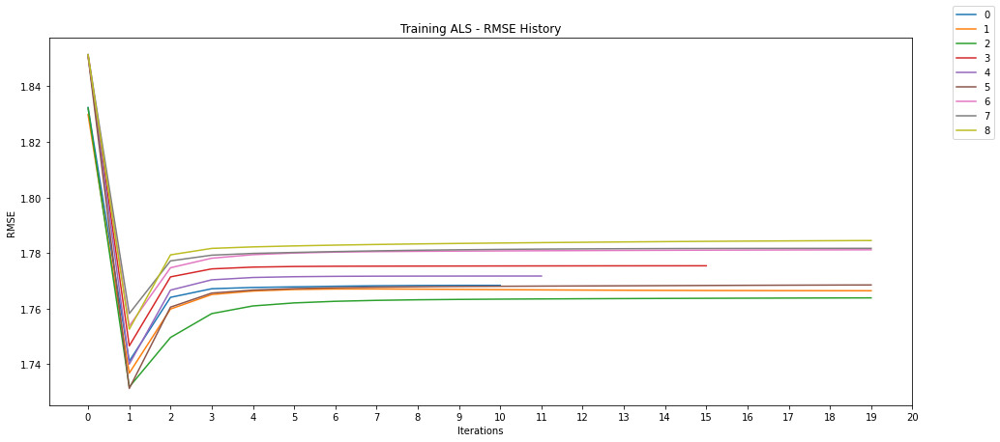

In [33]:
lines = results.History

plt.figure(figsize=(16,7))

for l in lines:
    plt.plot(l)

plt.xticks(np.arange(n_iterations[0]+1))
plt.legend(lines.index,loc='upper right',bbox_to_anchor=(1.1, 1.1))
plt.title('Training ALS - RMSE History')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.show();

Nice to see the covergences in actions..  
But the ALS does not show great good results.

In [34]:
als_final = results.iloc[results.RMSE.nsmallest(1).index][['RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10']].to_dict('records')[0]
als_final['Method'] = 'ALS'
als_final['Time_Ratio'] = end/len(results)

final_results = final_results.append(als_final,ignore_index=True)

<br><br><br>

#### GD vs ALS

In a **Gradient descent** (GD) approach, for each example in the dataset you compute the error and then you update the parameters by a factor in the opposite direction of the gradient.

The Alternating Least Squares (**ALS**) approach, represents a different way to optimizing the loss function.   
The key insight is that you can turn the non-convex optimization problem in Equation into an “easy” quadratic problem if you fix either.   
ALS fixes each one of those alternatively. When one is fixed, the other one is computed, and vice versa.


In [35]:
n_iterations   = 20 
convergence    = 1e-5  
latent_factors = 5
regularization = 0.1
learning_rate  = 0.1
kfolds = np.arange(len(dfs))+1


methods = ['GD','ALS']
results = pd.DataFrame(columns=['Method','Time','RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10','History'])

for method in methods: 
    dic = {'Method':method}
    means = pd.DataFrame(columns=['RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10'])
    for k in kfolds:
        # get the Kth fold
        train,test = df2matrix(k)

        # initial MF
        mf = MF(train.values,n_factors=lf)

        start = time.time()
        # train MF
        mf.train(n_iterations=n_iter,verbose=False,optim=method,learning_rate=lr,regularization=reg,convergence=conv)
        dic.update({'Time':time.time()-start})
        
        # eval MF
        em = eval_metrics(train,mf.predict_all(),test)
        e  = em.get_error()
        means = means.append(e,ignore_index=True)

    # after Kfolds loop
    dic.update(means.mean().to_dict())
    dic.update({'History':mf.history})
    results = results.append(dic,ignore_index=True)

results

,Method,Time,RMSE,MRR_5,MRR_10,NDCG_5,NDCG_10,History
0,GD,1.096067,1.504039,0.878294,0.879020,0.925142,0.914839,"[1.8513339785138714, 1.8131387112330057, 1.836..."
1,ALS,11.313849,3.040355,0.962875,0.962962,0.958472,0.951380,"[1.8513339785138714, 1.7528272303344696, 1.778..."


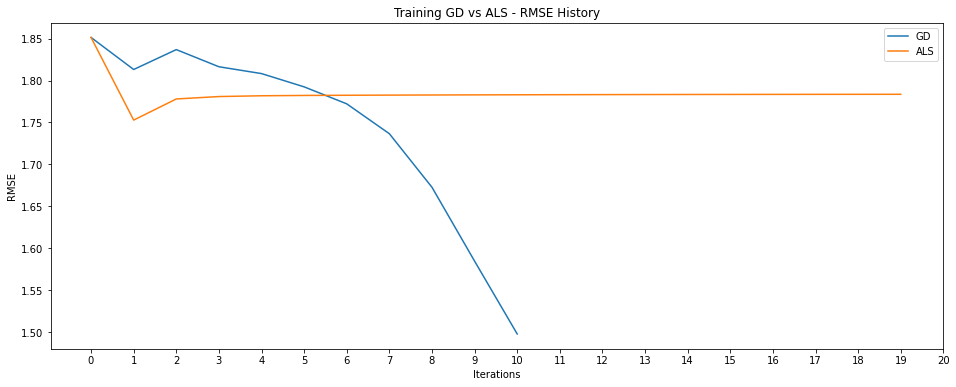

In [36]:
# drop covergences due to very short length
lines = results.History

plt.figure(figsize=(16,6))

for l in lines:
    plt.plot(l)

plt.xticks(np.arange(n_iterations+1))
plt.legend(['GD','ALS'])
plt.title('Training GD vs ALS - RMSE History')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.show();

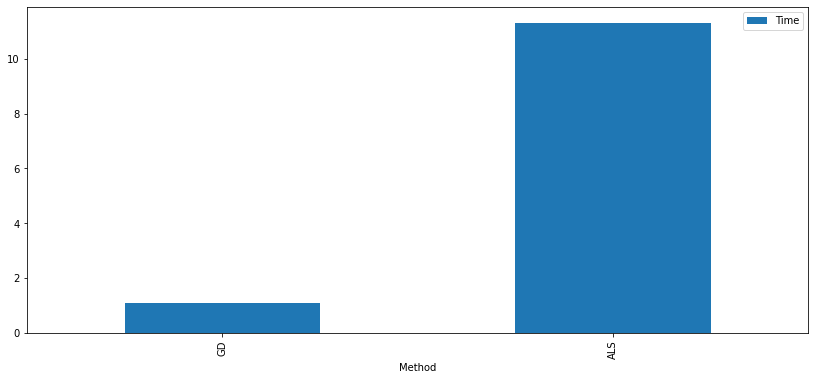

In [37]:
results.plot(x='Method',y='Time',kind='bar',figsize=(14,6));

**Conclutions:**

Main benefits of ALS:
- *First, this is very easy to parallelize.*    
- *Second, whenever dealing with implicit datasets, which are usually not sparse, GD is not practical.*  

ALS is a much more efficient optimization technique in these cases.*


**But in this case GD takes it all - more Accurate, better recommendations, less training time.**


<br><br><br><br><br>

### Simple Popolarity Model

In [38]:
ratings_df = pd.read_csv(data_dir + r"//" + "u.data", sep="\t", header=None)
ratings_df.columns = ['userId', 'movieId', 'rating', 'timestamp']

nunique_users = ratings_df["userId"].nunique()
nunique_movies = ratings_df["movieId"].nunique()


num_users = nunique_users
num_movies = nunique_movies
rating_df_columns = ['userId', 'movieId', 'rating', 'timestamp']
min_movie_ratings = 10
popularity_fold_results_df = pd.DataFrame([], columns=["mrr_5", "mrr_10", "ndcg_5", "ndcg_10"])
popularity_final_result_df = pd.DataFrame([], columns=["avg_mrr_5", "avg_mrr_10", "avg_ndcg_5", "avg_ndcg_10"])

start = time.time()

for fold in range(1,6):
    training_arr = np.zeros((num_users, num_movies))
    training_df = pd.read_csv(data_dir + r"//" + f"u{fold}.base", sep="\t", header=None)
    training_df.columns = rating_df_columns
    training_indices = [list(training_df['userId'] - 1), list(training_df['movieId'] - 1)]
    training_arr[training_indices] = training_df['rating'].values

    test_arr = np.zeros((num_users, num_movies))
    test_df = pd.read_csv(data_dir + r"//" + f"u{fold}.test", sep="\t", header=None)
    test_df.columns = rating_df_columns
    test_indices = [list(test_df['userId'] - 1), list(test_df['movieId'] - 1)]
    test_arr[test_indices] = test_df['rating'].values

    recommended_movie_ids = popularity_base_recommender(training_df, 10, min_movie_ratings)
    zero_inds = training_arr == 0
    training_arr[zero_inds] = np.nan
    top_movie_mean_rating = np.nanmean(training_arr, axis=0)[recommended_movie_ids]
    training_arr[:,recommended_movie_ids] = top_movie_mean_rating
    training_arr = np.nan_to_num(training_arr)

    relevant_users_inds = test_arr.any(axis=1)
    relevant_preds = training_arr[relevant_users_inds, :]
    relevant_test = test_arr[relevant_users_inds, :]

    mrr_5 = MRR(relevant_preds, relevant_test, 5)
    mrr_10 = MRR(relevant_preds, relevant_test, 10)
    ndcg_5 = get_mean_ndcg(relevant_preds, relevant_test, 5)
    ndcg_10 = get_mean_ndcg(relevant_preds, relevant_test, 10)
    
    conf = f"fold_{fold}"
    temp_df = pd.DataFrame([[mrr_5, mrr_10, ndcg_5, ndcg_10]], index=[conf], columns=["mrr_5", "mrr_10", "ndcg_5", "ndcg_10"])
    popularity_fold_results_df = popularity_fold_results_df.append(temp_df)

end = time.time()-start
end

0.80391526222229

<br>
Look how fast this is !!

<br><br><br>

In [39]:
popularity_fold_results_df

,mrr_5,mrr_10,ndcg_5,ndcg_10
fold_1,0.054321,0.024593,0.332192,0.326632
fold_2,0.041322,0.020801,0.247520,0.240284
fold_3,0.030744,0.016375,0.197918,0.193650
fold_4,0.032304,0.016826,0.193421,0.189576
fold_5,0.023966,0.012467,0.163753,0.160175


In [40]:
# popularity final results

bias_global = train.sum().sum()/train.astype(bool).sum().sum()

means = test.mean()
means[ np.setdiff1d(test.columns,train.columns) ] = bias_global
means[ np.intersect1d(test.columns,train.columns) ] = train.mean() [np.intersect1d(test.columns,train.columns)]

avg_pop_rmse = pop_RMSE(train,test,bias_global)
avg_mrr_5 = round(popularity_fold_results_df['mrr_5'].mean(), 3)
avg_mrr_10 = round(popularity_fold_results_df['mrr_10'].mean(), 3)
avg_ndcg_5 = round(popularity_fold_results_df['ndcg_5'].mean(), 3)
avg_ndcg_10 = round(popularity_fold_results_df['ndcg_10'].mean(), 3)

pop_final_df = pd.DataFrame([[avg_pop_rmse,avg_mrr_5, avg_mrr_10, avg_ndcg_5, avg_ndcg_10]], columns=['RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10'])

pop_final = pop_final_df.to_dict('records')[0]
pop_final['Method'] = 'POP'
pop_final['Time_Ratio'] = end/len(popularity_fold_results_df)

final_results = final_results.append(pop_final,ignore_index=True)

pop_final_df

,RMSE,MRR_5,MRR_10,NDCG_5,NDCG_10
0,1.728443,0.037,0.018,0.227,0.222


<br><br><br>

**Conclutions:**

- This is a super faset method!
- This could be a nice baseline.
- This could use for trending recommendations.
- This is not a good method for recommendations (MRR & NDCG are bad)

<br><br><br>

# Bias only based model

In [41]:
n_iterations   = [20] # due to computational power
convergence    = [1e-5]  # used only 1 due to moodle note form Asi
latent_factors = [5,10,20]
regularization = [0.01,0.1,1]
learning_rate  = [0.1]
kfolds = np.arange(len(dfs))+1

results = pd.DataFrame(columns=['Latent_factors','Iterations','Learning_Rate','Regularization','Convergence','RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10','History'])

start = time.time()
for lf in latent_factors:
    for n_iter in n_iterations:
        for lr in learning_rate:
            for reg in regularization:
                for conv in convergence:
                    dic = {'Latent_factors':lf,'Iterations':n_iter,'Learning_Rate':lr,'Regularization':reg,'Convergence':conv}

                    means = pd.DataFrame(columns=['RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10'])
                    for k in kfolds:
                        # get the Kth fold
                        train,test = df2matrix(k)

                        # initial MF
                        mf = MF(train.values,n_factors=lf,only_bias=True)

                        # train MF
                        mf.train(n_iterations=n_iter,verbose=False,optim='GD',learning_rate=lr,regularization=reg,convergence=conv)

                        # eval MF
                        em = eval_metrics(train,mf.predict_all(),test)
                        e  = em.get_error()
                        means = means.append(e,ignore_index=True)

                    # after Kfolds loop
                    dic.update(means.mean().to_dict())
                    dic.update({'History':mf.history})
                    results = results.append(dic,ignore_index=True)

end = time.time() - start                    
                    
results

,Latent_factors,Iterations,Learning_Rate,Regularization,Convergence,RMSE,MRR_5,MRR_10,NDCG_5,NDCG_10,History
0,5,20,0.1,0.01,0.00001,2.214457,0.908004,0.908270,0.934285,0.924087,"[1.5467450177709214, 1.5297139859512843, 1.517..."
1,5,20,0.1,0.10,0.00001,1.973460,0.897072,0.897274,0.931992,0.922308,"[1.5413082509400136, 1.5194975818271028, 1.502..."
2,5,20,0.1,1.00,0.00001,1.364483,0.883487,0.884086,0.928199,0.917757,"[1.5290113317190108, 1.4599325217854893, 1.401..."
3,10,20,0.1,0.01,0.00001,2.206719,0.908266,0.908499,0.934659,0.924767,"[1.53701111835101, 1.51833476865377, 1.5044373..."
4,10,20,0.1,0.10,0.00001,1.997247,0.892284,0.892640,0.929626,0.919481,"[1.5579281360846517, 1.5350175608554602, 1.516..."
5,10,20,0.1,1.00,0.00001,1.366087,0.883635,0.884323,0.927635,0.917378,"[1.5435757562714796, 1.4760792927740733, 1.417..."
6,20,20,0.1,0.01,0.00001,2.174736,0.909049,0.909352,0.934553,0.924412,"[1.5344535530252241, 1.516582881317171, 1.5035..."
7,20,20,0.1,0.10,0.00001,1.972470,0.902127,0.902931,0.933062,0.922226,"[1.5282182041362726, 1.5058740007646292, 1.488..."
8,20,20,0.1,1.00,0.00001,1.360770,0.887428,0.888116,0.928889,0.918286,"[1.5400013313114906, 1.4725348034963053, 1.414..."


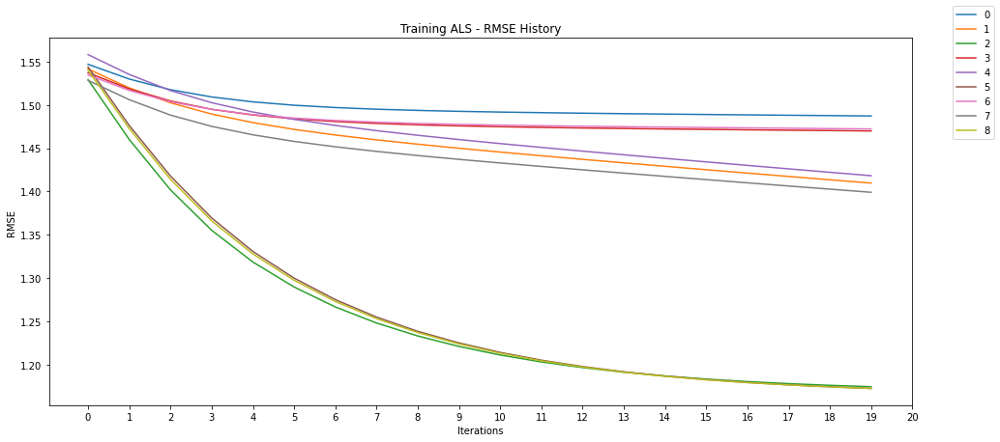

In [42]:
lines = results.History

plt.figure(figsize=(16,7))

for l in lines:
    plt.plot(l)

plt.xticks(np.arange(n_iterations[0]+1))
plt.legend(lines.index,loc='upper right',bbox_to_anchor=(1.1, 1.1))
plt.title('Training ALS - RMSE History')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.show();

In [43]:
results.loc[results.RMSE.nsmallest(3).index,:]

,Latent_factors,Iterations,Learning_Rate,Regularization,Convergence,RMSE,MRR_5,MRR_10,NDCG_5,NDCG_10,History
8,20,20,0.1,1.0,0.00001,1.360770,0.887428,0.888116,0.928889,0.918286,"[1.5400013313114906, 1.4725348034963053, 1.414..."
2,5,20,0.1,1.0,0.00001,1.364483,0.883487,0.884086,0.928199,0.917757,"[1.5290113317190108, 1.4599325217854893, 1.401..."
5,10,20,0.1,1.0,0.00001,1.366087,0.883635,0.884323,0.927635,0.917378,"[1.5435757562714796, 1.4760792927740733, 1.417..."


In [44]:
bias_final = results.iloc[results.RMSE.nsmallest(1).index][['RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10']].to_dict('records')[0]
bias_final['Method'] = 'BIAS'
bias_final['Time_Ratio'] = end/len(results)

final_results = final_results.append(bias_final,ignore_index=True)

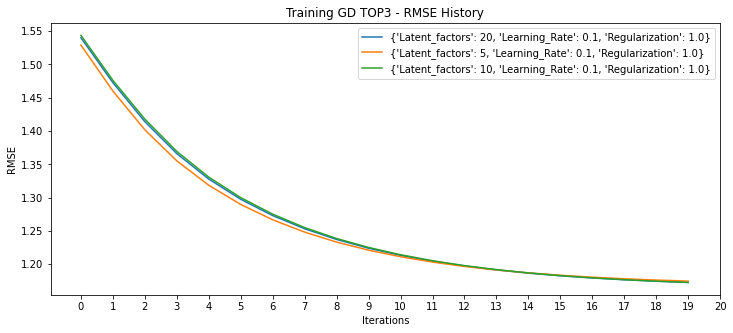

In [45]:
lines = lines[results.RMSE.nsmallest(3).index]
plt.figure(figsize=(12,5))

for l in lines:
    plt.plot(l)

plt.xticks(np.arange(n_iterations[0]+1))

leg = (results.loc[results.RMSE.nsmallest(3).index,['Latent_factors','Learning_Rate','Regularization']]).T.to_dict().values()
plt.xticks(np.arange(n_iterations[0]+1))
plt.title('Training GD TOP3 - RMSE History')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.legend(leg)
plt.show();

<br><br>
**Conclusions:**  

The Bias only model doing kinda **great** .     
it's a **suprise** for me that this "simple" model can achieve great results, while it's so simple.  

<br><br><br><br><br><br><br><br><br>

#### Different Methos - Conclude Final Results 

<br><br>

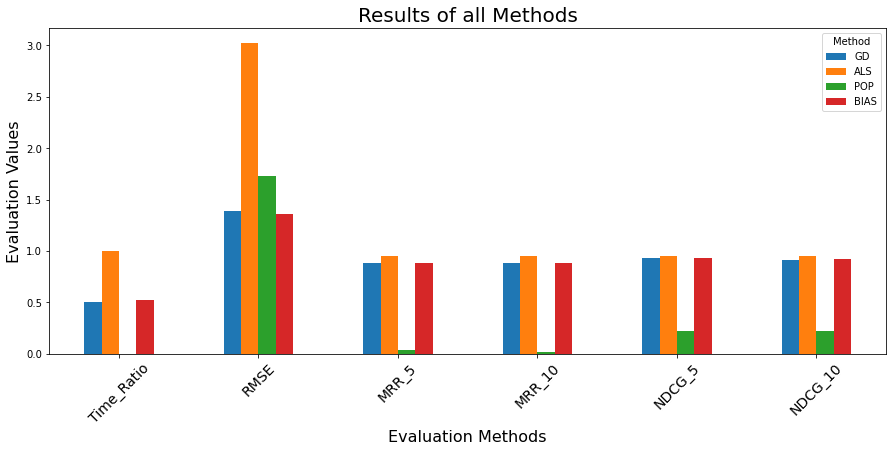

,Time_Ratio,RMSE,MRR_5,MRR_10,NDCG_5,NDCG_10
Method,,,,,,
GD,0.506360,1.391769,0.879644,0.880312,0.927500,0.916852
ALS,1.000000,3.018206,0.953964,0.953964,0.954372,0.947396
POP,0.003392,1.728443,0.037000,0.018000,0.227000,0.222000
BIAS,0.522388,1.360770,0.887428,0.888116,0.928889,0.918286


In [46]:
final_results = final_results.set_index('Method')
final_results['Time_Ratio'] = final_results['Time_Ratio']/final_results['Time_Ratio'].max()

final_results.T.plot(kind="bar", figsize=(15,6))
plt.title("Results of all Methods", fontsize=20)
plt.xlabel("Evaluation Methods", fontsize=16)
plt.ylabel("Evaluation Values", fontsize=16)
plt.xticks(fontsize=14, rotation=45)
plt.show();

final_results

<br><br><br><br><br><br><br>

**Describe your challenges and findings, including comparison between the algorithms as well as your recommendations for how to select the latent factor dimension, the contribution of regularization and pros\cons of the different algorithms.**

**In your comparison refer to the evaluation metrics, training and inference duration, learning convergence and additional aspects you find relevant.**

popularity bias: refers to system recommends the movies with the most interactions without any personalization

item cold-start problem: refers to when movies added to the catalogue have either none or very little interactions while recommender rely on the movie’s interactions to make recommendations

scalability issue: refers to lack of the ability to scale to much larger sets of data when more and more users and movies added into our database

**MRR**
- Pros: 
    - This method is simple to compute and is easy to interpret.
    - Because it puts a high focus on the first relevant element of the list - suited for targeted searches such as users asking for the “best item for me”.
    - Good for known-item search such as navigational queries or looking for a fact.

- Cons:  
    - The MRR metric does not evaluate the rest of the list of recommended items.
    - It gives a list with a single relevant item just a much weight as a list with many relevant items. It is fine if that is the target of the evaluation.
    - This might not be a good evaluation metric for users that want a list of related items to browse. The goal of the users might be to compare multiple related items.
    
**NDCG**
- Pros:
    - The primary advantage of the NDCG is that it takes into account the graded relevance values. 
    - Compared to the MAP metric it does a good job at evaluating the position of ranked items. It operates beyond the binary relevant/non-relevant scenario.
    - The smooth logarithmic discounting factor has a good theoretical basis. For every pair of substantially different ranking recommender, the NDCG metric is consistently able to determine the better one.

- Cons:
    - The NDCG has some issues with partial feedback. This happens when we have incomplete ratings. This is case for the majority of recommender systems situations. If we had complete ratings there would be no real task to achieve! I need to decide how to impute the missing ratings.
    - I had to manually handle the case where the IDCG is equal to zero. This occurs when users have no relevant documents. 

<br><br><br><br><br>


**Final thoughts:**

Popularity model was just a baseline.  
I find it curious that SGD outperforms ALS.  
The ALS you show is a 2nd order optimization, whereas SGD is 1st order.  

I not sure, but I believe ALS should **overfit** more since it is the MLE estimate of each alternate variable’s regression problem.
It should fit the rare cases as well as popular (in terms of optimization, not generalization).    
SGD likely does better for popular cases because it only updates when it sees an instance.    
Thus a movie with 100 ratings will get 10x more updates than a movie with 10 ratings.    
Given the same learning rate, this is like a form of extra regularization (similar to early stopping) on the rare cases. 



GD & ALS give very good results, but takes a lot of time to train.   
As the matrix get bigger, so is the training time. And **at scale** I pretty sure both will perfore bad. 
This is why I personly relly like the **bias model**, which is a huge suprise. **Simple, Elegant, Quick.**  

Dimenssion **K=5** condence the information in a good way, and keep the number of params low.  
If I had the time, I would check also k=4,5,6,7.   
But the models are effected a lot by the **LR & REG** , which is also surprising.  
If I had the time, I would use a evaluation dataset (60%,20%,20%) and set a good values for the REG.

Something weird is that with high $\gamma$ results in "spikey" learning process.  
Also, If I had the time I would implement a mini-batch GD.  

Moreover, when choosing a model we need to consider the "new item"/"new user" & a cold start, cuz this will highly effect the cost and time.  
For example, To train each time a new rating added to the system is a bad idea, but how many rating needed to run the training agian? I don't have this knowledge yet.

When added a new user, we should get them to rate a few known items, otherwaise we won't know what to recommend.
If this is not a possible, probably recommend the poplar, or the poplar for each genre, or the "trainding" items.

It's easy to see that RMSE is a good metric for RecSys (it's kinde irrelevant), and really liked MAP (hich we did not need to implement).     
But MRR is also nice, but don't penalize on the entire window, compare to NDCG. but it still works. which is great.


<br><br><br><br><br>

# Question 3: Matrix factorization – item similarity and model explainability (25 points)

**a) Suggest a method to find similarity between items.   
Demonstrate the approach on a set of 5 item pairs of your choice based on item representation by your best matrix factorization
model.   
Leverage the items side information available in the dataset to demonstrate the effectiveness of the suggested approach.**

In [47]:
train,test = df2matrix(3)            
mf = MF(train.values,n_factors=5,only_bias=False)
mf.train(n_iterations=30,verbose=False,optim='GD',regularization=1.0,convergence=1e-5,learning_rate=0.1)

Known methods to find similarity between items:  
- Pearson Corellation  
- Cosine Similarity 
- Mean Difference
- L2 Distance

In [48]:
def get_item2vec(mf,i):
    return mf.cols[i-1]

def get_pearson(a1,a2):
    return pearsonr(a1, a2)[0]

def get_cosine(a1,a2):
    return cosize(a1,a2)

def get_mean_diff(a1,a2):
    return np.mean(np.abs(a1 - a2))
    
def get_l2(a1,a2):
    return np.linalg.norm(a1 - a2)

def get_correlation(mf,ids):
    d = pd.DataFrame(columns=ids)
    for c in d.columns:
        d.loc[:,c] = get_item2vec(mf,c)

    d.columns = df_items.movie_title[ df_items['movie id'].isin(ids) ].values         
    return d.corr()

I can use all of them, some will be more effective.  
So I'll choose **Pearson correlation** due to it's expenability and common sense.

**First set of items:**

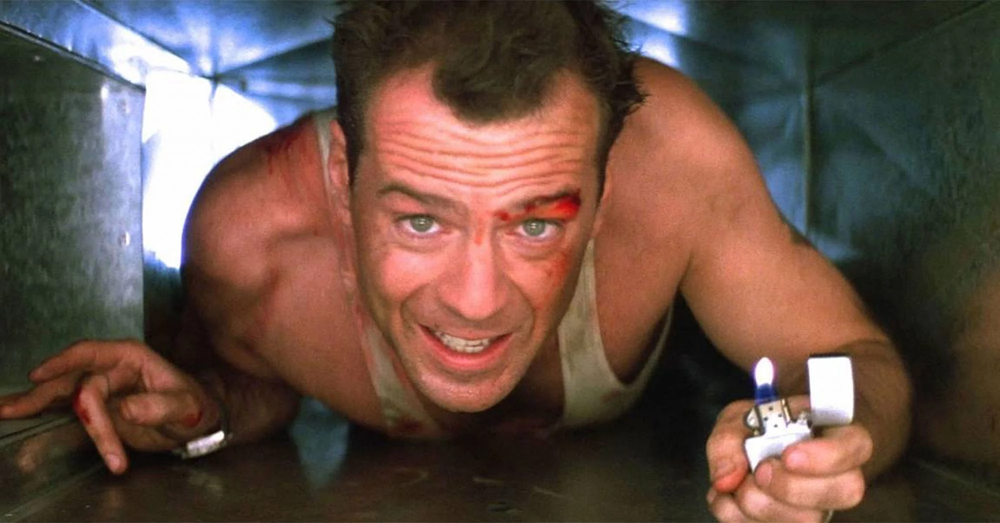

In [49]:
DieHard1 = 144
DieHard2 = 226
DieHard3 = 550

l = [144,226,550]
get_correlation(mf,l)

,Die Hard (1988),Die Hard 2 (1990),Die Hard: With a Vengeance (1995)
Die Hard (1988),1.000000,-0.326855,-0.138562
Die Hard 2 (1990),-0.326855,1.000000,-0.390641
Die Hard: With a Vengeance (1995),-0.138562,-0.390641,1.000000


I can see that DieHard1 is mych more similar to DieHard2 then DieHard3 

**Second set of items:**

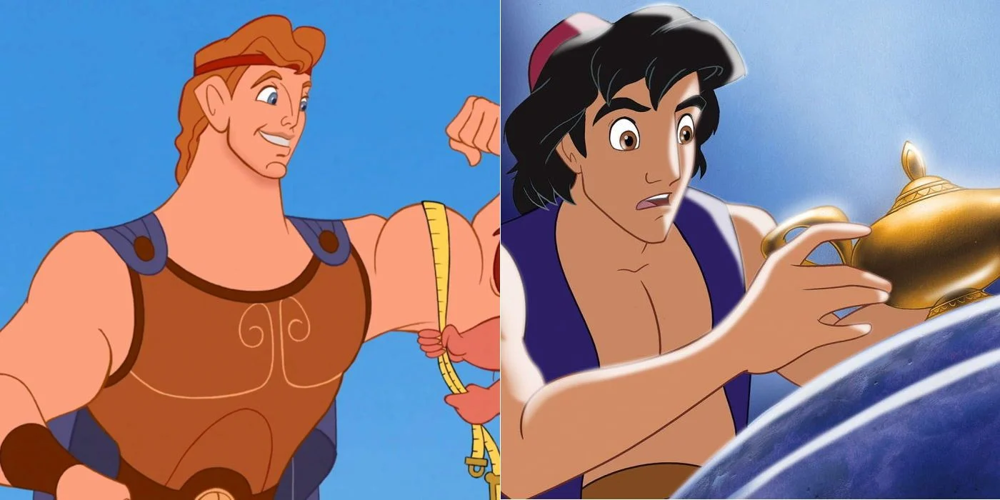

In [50]:
Aladdin1 = 95
Aladdin2 = 422
Hercules = 993

l = [95,422,993]
get_correlation(mf,l)

,Aladdin (1992),Aladdin and the King of Thieves (1996),Hercules (1997)
Aladdin (1992),1.000000,-0.001294,-0.274290
Aladdin and the King of Thieves (1996),-0.001294,1.000000,-0.274499
Hercules (1997),-0.274290,-0.274499,1.000000


I can see the positive correlation between the Aladdins movies.  
Although there is some negative correlation between Hercules and Aladdin1. which doesn't make a lot of sense for me.

**Third set of items:**

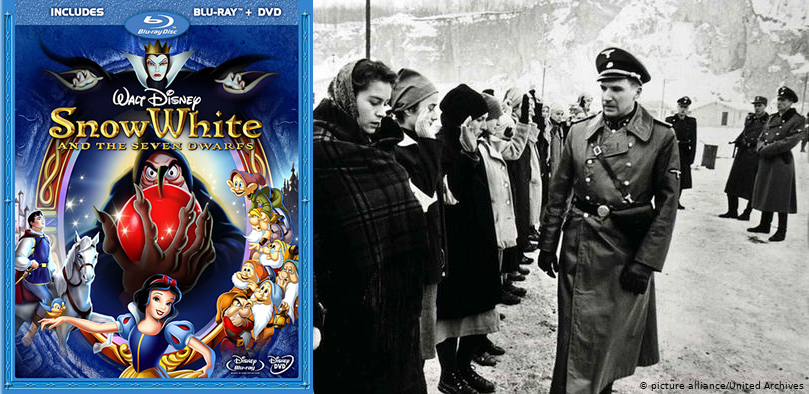

In [51]:
SnowWhite = 99
Schindler = 318

l = [99,318]
get_correlation(mf,l)

,Snow White and the Seven Dwarfs (1937),Schindler's List (1993)
Snow White and the Seven Dwarfs (1937),1.000000,0.137187
Schindler's List (1993),0.137187,1.000000


There is a low negative correlation between them - which make sense.  
Although, I whould like to see less correlation between them.

**Fourth set of items:**

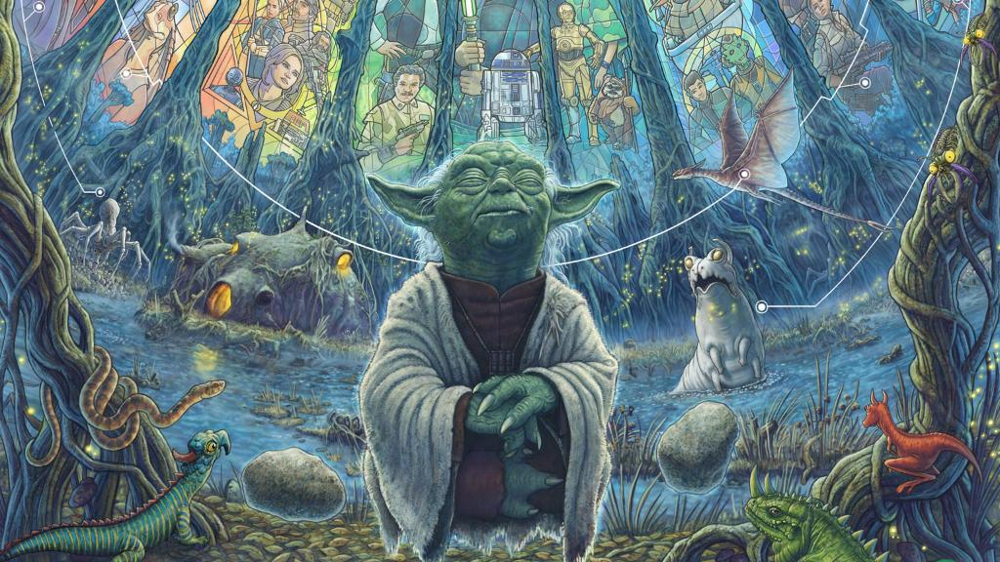

In [52]:
StarWars = 50
ReturnOfTheJedi = 181

l = [50,181]
get_correlation(mf,l)

,Star Wars (1977),Return of the Jedi (1983)
Star Wars (1977),1.000000,0.263003
Return of the Jedi (1983),0.263003,1.000000


There is some correlation between them, but I would expect it to be highter.

**Fifth set of items:**

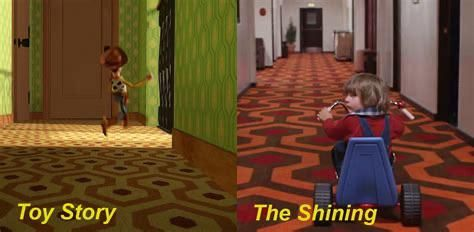

In [53]:
ToyStory = 1
Shining = 199

l = [1,199]
get_correlation(mf,l)

,Toy Story (1995),"Bridge on the River Kwai, The (1957)"
Toy Story (1995),1.000000,0.763732
"Bridge on the River Kwai, The (1957)",0.763732,1.000000


I wanted to bring this example, becuase this way I can show that this is not the optimal method,   
and although the MF figure out some correlation between these movies - I can't see why...

**b) Select two latent dimensions of your matrix factorization model and try to estimate the latent ‘meaning’ of the learnt matrix factorization model.     
Demonstrate your estimation, using few items from the dataset and the items side information available in the dataset and\or external information.**

<br><br><br><br>

I assume that if I'll choose different genres I will get a good seperation.

<br><br>
**Let's check for Drava VS Action  
While using the latent 0 compere to 1,2,3,4**

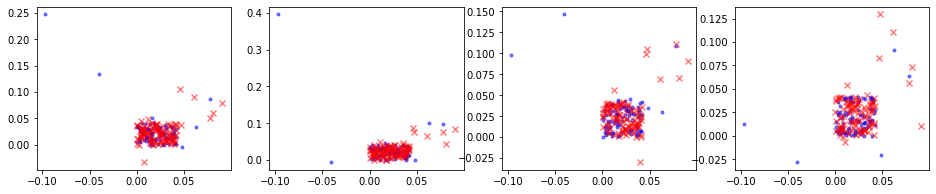

In [54]:
action = df_items[df_items.Action == 1]['movie id'][1:100] 
drama =  df_items[df_items.Drama == 1]['movie id'][1:100]

fig, ax = plt.subplots(1,4,figsize=(16,3))

for i in range(1,5):
    action_vecs = mf.cols[action-1][:,[0,i]]
    drama_vecs = mf.cols[drama-1][:,[0,i]]

    ax[i-1].scatter(action_vecs[:,0], action_vecs[:,1], marker='.',color='blue',alpha=0.5)
    ax[i-1].scatter(drama_vecs[:,0], drama_vecs[:,1], marker='x',color='red',alpha=0.5)


Not a good seperation!  

I hoped to find some "cluster".

<br><br>
**Let's check for Drava VS Comedy  
While using the latent 0 compere to 1,2,3,4**

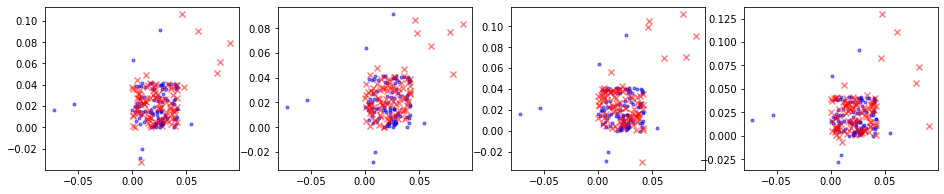

In [55]:
comedy = df_items[df_items.Comedy == 1]['movie id'][1:100] 
drama =  df_items[df_items.Drama == 1]['movie id'][1:100]

fig, ax = plt.subplots(1,4,figsize=(16,3))

for i in range(1,5):
    comedy_vecs = mf.cols[comedy-1][:,[0,i]]
    drama_vecs = mf.cols[drama-1][:,[0,i]]

    ax[i-1].scatter(comedy_vecs[:,0], action_vecs[:,1], marker='.',color='blue',alpha=0.5)
    ax[i-1].scatter(drama_vecs[:,0], drama_vecs[:,1], marker='x',color='red',alpha=0.5)


Not a good seperation!  but a better then before.

I hoped to find some "cluster".

<br><br><br>

Although I didn't find any meaning in the latent space, I would assume that for movies about "love"/Romantic/Drama will be in some similiar cluster, while movies about War/Thriller/Horor will be in some other cluster.

Cuz the latent vector should condenss and **EMBED** the movies, in some way.

In [ ]:
train,test = df2matrix(3)            
# mf = MF(train.values,n_factors=5,only_bias=False)
# mf.train(n_iterations=30,verbose=False,optim='GD',regularization=1.0,convergence=1e-5,learning_rate=0.1)

In [58]:
train.columns

Int64Index([   1,    2,    3,    4,    5,    6,    7,    8,    9,   10,
            ...
            1673, 1674, 1675, 1676, 1677, 1678, 1679, 1680, 1681, 1682],
           dtype='int64', name='item_id', length=1650)

In [ ]:
def get_correlation(mf,ids):
    d = pd.DataFrame(columns=ids)
    for c in d.columns:
        d.loc[:,c] = get_item2vec(mf,c)

    d.columns = df_items.movie_title[ df_items['movie id'].isin(ids) ].values         
    return d.corr()

In [59]:
get_correlation(MF,train.columns)

AttributeError: type object 'MF' has no attribute 'cols'

In [138]:
c = get_correlation(mf,list(train.columns[0:1620]))
df_items.iloc[c['Star Wars (1977)'].argsort()[::-1][:6].values].movie_title.values

array(['Star Wars (1977)', 'Leaving Las Vegas (1995)',
       'Lost World: Jurassic Park, The (1997)', 'Crimson Tide (1995)',
       'Visitors, The (Visiteurs, Les) (1993)', 'Neon Bible, The (1995)'],
      dtype=object)

,movie id,movie_title,release_date,video_release_date,IMDb_URL,unknown,Action,Adventure,Animation,Childrens,...,Fantasy,Film_Noir,Horror,Musical,Mystery,Romance,Sci_Fi,Thriller,War,Western
94,95,Aladdin (1992),01-Jan-1992,NaN,http://us.imdb.com/M/title-exact?Aladdin%20(1992),0,0,0,1,1,...,0,0,0,1,0,0,0,0,0,0
7,8,Babe (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Babe%20(1995),0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
60,61,Three Colors: White (1994),01-Jan-1994,NaN,http://us.imdb.com/M/title-exact?Trzy%20kolory...,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
25,26,"Brothers McMullen, The (1995)",01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Brothers%20Mc...,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
61,62,Stargate (1994),01-Jan-1994,NaN,http://us.imdb.com/M/title-exact?Stargate%20(1...,0,1,1,0,0,...,0,0,0,0,0,0,1,0,0,0
28,29,Batman Forever (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Batman%20Fore...,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [82]:
c = np.abs(c)
c['Star Wars (1977)'].argsort()[::-1][0:20]

Men With Guns (1997)                                    49
Butcher Boy, The (1998)                                275
Angel Baby (1995)                                      583
Some Mother's Son (1996)                               251
Dadetown (1995)                                         30
Eighth Day, The (1996)                                 294
Bitter Sugar (Azucar Amargo) (1996)                   1471
Normal Life (1996)                                     673
Girls Town (1996)                                     1318
Brothers in Trouble (1995)                            1565
Two Friends (1986)                                    1255
Etz Hadomim Tafus (Under the Domin Tree) (1994)        944
Á köldum klaka (Cold Fever) (1994)                       0
Slingshot, The (1993)                                  131
Silence of the Palace, The (Saimt el Qusur) (1994)    1233
Nico Icon (1995)                                      1150
Lamerica (1994)                                       14